<a href="https://colab.research.google.com/github/datascience-uniandes/eda-tutorial/blob/master/airbnb/eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis (EDA)

MINE-4101: Applied Data Science  
Universidad de los Andes  
**Danilo Andrés Alfonso Bohórquez**


**Contexto de Negocio:** Con la creciente popularidad de este modelo de negocio de AIRBNB, es cada
vez más difícil hacer buenas elecciones de sectores de la ciudad y tipos de propiedades,
entre otro tipo de factores, para lograr una rentabilidad adecuada a lo largo del tiempo la
cual puede estar dada en términos de una alta tasa de ocupación y un precio por noche
que los usuarios estarían dispuestos a pagar. En ese sentido, extraeremos algunos insights relevantes tomando como base los alojamientos de la ciudad de Buenos Aires, Argentina.


Last update: August, 2023

In [1]:
# Importamos todas las librerías necesarias
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
from matplotlib.image import imread
import plotly.graph_objs as go
import plotly.graph_objs as go
from plotly.subplots import make_subplots
!pip install altair
import altair as alt

In [2]:
# Configuramos pandas para obtener el número de filas y columnas necesarias 
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

#Quitamos los mensajes de advertencia

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)

### ENTENDIMIENTO INICIAL DE LOS DATOS 

## 1. Loading the data (cargamos los datasets necesarios)

In [3]:
# Cargamos los datasets necesarios para nuestro análisis
listings_df = pd.read_csv("listings_buenosaires.csv.gz")
calendar=pd.read_csv("calendar.csv.gz")


## PRE-PROCESAMIENTO DE LOS DATOS

# Dataset Listings_df

In [4]:
listings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26204 entries, 0 to 26203
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            26204 non-null  int64  
 1   listing_url                                   26204 non-null  object 
 2   scrape_id                                     26204 non-null  int64  
 3   last_scraped                                  26204 non-null  object 
 4   source                                        26204 non-null  object 
 5   name                                          26204 non-null  object 
 6   description                                   25635 non-null  object 
 7   neighborhood_overview                         14590 non-null  object 
 8   picture_url                                   26204 non-null  object 
 9   host_id                                       26204 non-null 

In [5]:
# Mostramos las dimensiones de nuestro dataframe 
listings_df.shape

(26204, 75)

In [6]:
#Información de los datos
print('\nFilas : ',listings_df.shape[0]) #número de filas
print('\nColumnas :', listings_df.shape[1]) #número de columnas
print('\nColumnas:',listings_df.columns.to_list()) #lista de columnas
print(' \nÚnicos:\n',listings_df.nunique()) #número de términos únicos por variable


Filas :  26204

Columnas : 75

Columnas: ['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'avail

In [7]:
# Observamos la cantidad de columnas con valores nulos

percentage_result = listings_df.isnull().sum()/listings_df.shape[0] * 100
# Creamos un DataFrame para mostrar los resultados
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "%": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,%
0,id,0.000000
1,listing_url,0.000000
2,scrape_id,0.000000
3,last_scraped,0.000000
4,source,0.000000
5,name,0.000000
6,description,2.171424
7,neighborhood_overview,44.321478
8,picture_url,0.000000
9,host_id,0.000000


In [8]:
#Las variables que tienen una gran cantidad de valores nulos (>95%) y no son estrictamente necesarias para el análisis las eliminamos
#De igual manera, eliminamos la variable ""neighbourhood" ya que ya está procesada como "neighbourhood_cleansed"
listings_df.drop(["neighbourhood_group_cleansed", "bathrooms","calendar_updated","license","neighbourhood"], axis=1, inplace=True)

In [9]:
listings_df.head(5)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11508,https://www.airbnb.com/rooms/11508,20230628025456,2023-06-29,city scrape,Condo in Buenos Aires · ★4.81 · 1 bedroom · 1 ...,LUXURIOUS 1 BDRM APT- POOL/ GYM/ SPA/ 24-HR SE...,AREA: PALERMO SOHO<br /><br />Minutes walking ...,https://a0.muscache.com/pictures/19357696/b1de...,42762,https://www.airbnb.com/users/show/42762,Candela,2009-10-01,"New York, NY",-,within an hour,100%,79%,t,https://a0.muscache.com/im/users/42762/profile...,https://a0.muscache.com/im/users/42762/profile...,Palermo,1,2,"['email', 'phone']",t,t,Palermo,-34.58184,-58.42415,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"[""Shared pool"", ""Hot water"", ""Shared sauna"", ""...","$17,339.00",3,1125,3,3,1125,1125,3.0,1125.0,t,0,21,51,208,2023-06-29,36,8,0,2012-07-02,2023-05-13,4.81,4.94,4.89,4.91,4.97,4.94,4.89,f,1,1,0,0,0.27
1,14222,https://www.airbnb.com/rooms/14222,20230628025456,2023-06-28,city scrape,Rental unit in Palermo/Buenos Aires · ★4.78 · ...,Beautiful cozy apartment in excellent location...,Palermo is such a perfect place to explore the...,https://a0.muscache.com/pictures/4695637/bbae8...,87710233,https://www.airbnb.com/users/show/87710233,María,2016-08-03,"Buenos Aires, Argentina","Soy Organizadora de Eventos, me gusta relacion...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/dc9d9...,https://a0.muscache.com/im/pictures/user/dc9d9...,NaN,9,11,"['email', 'phone']",t,t,Palermo,-34.58617,-58.41036,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hot water"", ""Paid parking off premises"", ""TV...","$7,807.00",7,365,7,7,365,365,7.0,365.0,t,0,0,0,261,2023-06-28,108,11,0,2012-07-10,2023-04-20,4.78,4.75,4.78,4.80,4.90,4.89,4.75,f,6,6,0,0,0.81
2,206738,https://www.airbnb.com/rooms/206738,20230628025456,2023-06-29,city scrape,Rental unit in Buenos Aires · ★4.71 · 3 bedroo...,Recently renovated 3 bedroom apartment in Pale...,Palermo is fortunate to have great transport l...,https://a0.muscache.com/pictures/8b3b1257-fe36...,1011896,https://www.airbnb.com/users/show/1011896,Natalia,2011-08-23,"Buenos Aires, Argentina",mi nombre es Natalia recibimos a la gente en ...,within an hour,100%,89%,f,https://a0.muscache.com/im/pictures/user/a28a8...,https://a0.muscache.com/im/pictures/user/a28a8...,Palermo,11,15,"['email', 'phone']",t,t,Palermo,-34.57819,-58.42964,Entire rental unit,Entire home/apt,9,1 bath,3.0,4.0,"[""Children\u2019s books and toys"", ""Fire extin...","$61,868.00",1,365,1,2,365,365,1.3,365.0,t,29,59,89,364,2023-06-29,43,1,0,2011-11-23,2023-04-09,4.71,4.60,4.68,4.84,4.80,4.84,4.68,f,11,11,0,0,0.30
3,210040,https://www.airbnb.com/rooms/210040,20230628025456,2023-06-29,city scrape,Condo in Buenos Aires · ★4.92 · 1 bedroom · 1 ...,Modern studio apartment on the 13th floor with...,If you’re an expa

In [10]:
#Realizamos el reemplazo de los valores nulos 

listings_df['neighborhood_overview'].fillna('Sin descripción',inplace = True)
listings_df['description'].fillna('Sin descripción',inplace = True)
listings_df['host_location'].fillna('Sin descripción',inplace = True)
listings_df['host_about'].fillna('Sin descripción',inplace = True)
listings_df['host_response_time'].fillna('NaN',inplace = True)
listings_df['host_response_rate'].fillna('NaN',inplace = True)
listings_df['host_acceptance_rate'].fillna('NaN',inplace = True)
listings_df['host_is_superhost'].fillna('NaN',inplace = True)
listings_df['host_neighbourhood'].fillna('NaN',inplace = True)
listings_df['bathrooms_text'].fillna('NaN',inplace = True)
listings_df['bedrooms'].fillna('NaN',inplace = True)
listings_df['beds'].fillna('NaN',inplace = True)
listings_df['first_review'].fillna('NaN',inplace = True)
listings_df['last_review'].fillna('NaN',inplace = True)
listings_df['review_scores_rating'].fillna(0.00,inplace = True)
listings_df['review_scores_accuracy'].fillna(0.00,inplace = True)
listings_df['review_scores_cleanliness'].fillna(0.00,inplace = True)
listings_df['review_scores_checkin'].fillna(0.00,inplace = True)
listings_df['review_scores_communication'].fillna(0.00,inplace = True)
listings_df['review_scores_location'].fillna(0.00,inplace = True)
listings_df['review_scores_value'].fillna(0.00,inplace = True)
listings_df['reviews_per_month'].fillna(0.00,inplace = True)


In [11]:
#Validamos nuevamente los valores nulos de nuestro dataFrame
percentage_result = listings_df.isnull().sum()/listings_df.shape[0] * 100
# Creamos un nuevo DataFrame para mostrar el resultado 
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "%": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,%
0,id,0.0
1,listing_url,0.0
2,scrape_id,0.0
3,last_scraped,0.0
4,source,0.0
5,name,0.0
6,description,0.0
7,neighborhood_overview,0.0
8,picture_url,0.0
9,host_id,0.0


In [12]:
#Realizamos la transformación de variables númericas que en realidad son variables categóricas


try:
    data = listings_df.astype({'id':'str','host_id':'str'})
except:
    next
    
data.dtypes

id                                               object
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_id                                          object
host_url                                         object
host_name                                        object
host_since                                       object
host_location                                    object
host_about                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                            

In [13]:
## Analisis estadistico de los datos númericos
data.describe()

,scrape_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,2.620400e+04,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,2.620400e+04,2.620400e+04,26204.000000,2.620400e+04,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000,26204.000000
mean,2.023063e+13,19.949626,27.689399,-34.590773,-58.418323,2.875248,6.300145,517.633415,5.924286,6.462067,5.743904e+05,5.743988e+05,6.253442,5.743962e+05,13.234354,33.230079,55.347428,213.903335,21.823386,9.561327,0.858342,3.854168,3.883840,3.819034,3.928500,3.925102,3.933554,3.812421,16.062815,15.213746,0.622996,0.082392,1.132396
std,1.164866e+01,53.366923,87.616200,0.018311,0.030168,1.480234,24.286468,765.951597,22.289832,22.644608,3.509500e+07,3.509500e+07,22.485628,3.509500e+07,11.232887,21.340103,31.128653,127.418208,38.715892,13.972815,1.464122,1.907345,1.920169,1.895791,1.935827,1.935361,1.932878,1.892029,33.051039,32.455952,2.693113,0.914151,1.361043
min,2.023063e+13,1.000000,1.000000,-34.693700,-58.530890,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.023063e+13,1.000000,1.000000,-34.601158,-58.438060,2.000000,2.000000,90.000000,2.000000,2.000000,3.650000e+02,3.650000e+02,2.000000,3.650000e+02,1.000000,14.000000,31.000000,89.000000,1.000000,0.000000,0.000000,4.330000,4.430000,4.210000,4.560000,4.500000,4.580000,4.200000,1.000000,1.000000,0.000000,0.000000,0.100000
50%,2.023063e+13,3.000000,4.000000,-34.590055,-58.420240,2.000000,3.000000,365.000000,3.000000,3.000000,1.125000e+03,1.125000e+03,3.000000,1.125000e+03,12.000000,37.000000,64.000000,227.000000,7.000000,4.000000,0.000000,4.800000,4.860000,4.750000,4.920000,4.920000,4.910000,4.750000,2.000000,2.000000,0.000000,0.000000,0.670000
75%,2.023063e+13,15.000000,18.000000,-34.580430,-58.393920,4.000000,4.000000,1125.000000,4.000000,5.000000,1.125000e+03,1.125000e+03,4.000000,1.125000e+03,25.000000,53.000000,83.000000,342.000000,25.000000,14.000000,1.000000,5.000000,5.000000,4.960000,5.000000,5.000000,5.000000,4.930000,11.000000,10.000000,0.000000,0.000000,1.710000
max,2.023063e+13,1837.000000,3334.000000,-34.534980,-58.355410,16.000000,1000.000000,99999.000000,1000.000000,1000.000000,2.147484e+09,2.147484e+09,1000.000000,2.147484e+09,30.000000,60.000000,90.000000,365.000000,657.000000,377.000000,29.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,188.000000,188.000000,29.000000,18.000000,20.470000


# Dataset Calendar 

In [14]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564447 entries, 0 to 9564446
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 510.8+ MB


In [15]:
#Mostramos las dimensiones de nuestro DataFrame
calendar.shape

(9564447, 7)

In [16]:
#Información de los datos
print('\nFilas : ',calendar.shape[0]) #número de filas
print('\nColumnas :', calendar.shape[1]) #número de columnas
print('\nColumnas:',calendar.columns.to_list()) #lista de columnas
print(' \nÚnicos:\n',calendar.nunique()) #número de términos únicos por variable


Filas :  9564447

Columnas : 7

Columnas: ['listing_id', 'date', 'available', 'price', 'adjusted_price', 'minimum_nights', 'maximum_nights']
 
Únicos:
 listing_id        26204
date                366
available             2
price              6615
adjusted_price     8823
minimum_nights       74
maximum_nights      189
dtype: int64


In [17]:
# Observamos la cantidad de columnas con valores nulos

percentage_result = calendar.isnull().sum()/listings_df.shape[0] * 100
# Creamos un DataFrame para mostrar el resultado
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "%": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,%
0,listing_id,0.000000
1,date,0.000000
2,available,0.000000
3,price,0.000000
4,adjusted_price,0.000000
5,minimum_nights,0.122119
6,maximum_nights,0.122119


# Analisis Univariado Room_Type 

In [18]:
#Realizamos el conteo por categorías de los tipos de habitación que existen
category_counts = data['room_type'].value_counts()
print("Frecuencia de cada categoría:")
print(category_counts)

Frecuencia de cada categoría:
Entire home/apt    23556
Private room        2343
Shared room          206
Hotel room            99
Name: room_type, dtype: int64


In [19]:
#Revisamos cuál es la proporción que existe para cada uno de los tipos de habitación
category_proportions = data['room_type'].value_counts(normalize=True)
print("Proporción de cada categoría:")
print(category_proportions)

Proporción de cada categoría:
Entire home/apt    0.898947
Private room       0.089414
Shared room        0.007861
Hotel room         0.003778
Name: room_type, dtype: float64


El modelo de negocio de Airbnb se centra principalmente en Entire home/apt y Private room por lo cual existe una gran diferencia 
respecto a shared room y Hotel room. En cuanto a las habitaciones de hotel actualmente existe una gran demanda de estas pero la aplicación 
no es la opción preferida por los usuarios

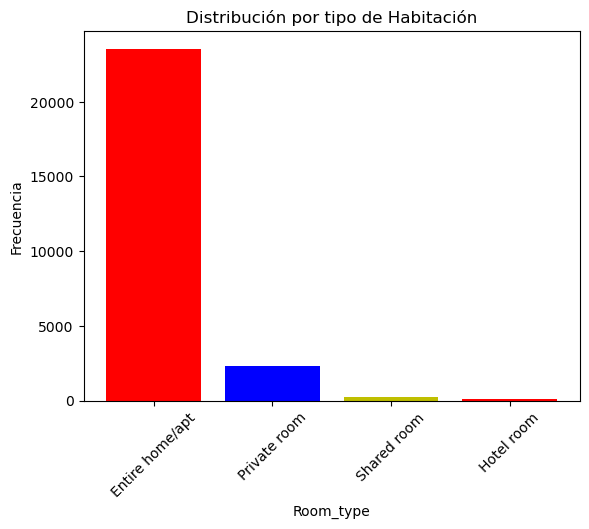

In [20]:
#Verificamos visualmente esttá información
plt.bar(category_counts.index, category_counts.values, color=['r','b','y'])
plt.title('Distribución por tipo de Habitación')
plt.xlabel('Room_type')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.show()

# Análisis Univariado Precios

In [21]:
#En primer lugar ajustamos el precio ya que se encuentra en un formato érroneo
# Quitamos de las columnas "price"  la "," sustituyéndola por nada
data["price"] = data.price.str.replace(",","")

# Quitamos de las columnas "price"  el símbolo "$" y hacemos las tablas del formato float.
data["price"] = pd.to_numeric(data['price'].str.strip('$'))


In [22]:
# Calcular estadísticas descriptivas básicas
print(data['price'].describe())

count    2.620400e+04
mean     1.752933e+04
std      1.754018e+05
min      1.750000e+02
25%      7.406500e+03
50%      1.019000e+04
75%      1.528600e+04
max      2.529509e+07
Name: price, dtype: float64


In [23]:
data.dtypes

id                                               object
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_id                                          object
host_url                                         object
host_name                                        object
host_since                                       object
host_location                                    object
host_about                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                            

In [24]:
#Validamos el rango de los precios para verificar en primer lugar los valores atípicos
range_age = data['price'].max() - data['price'].min()
print("Rango de los precios:", range_age)

Rango de los precios: 25294913.0


La diferencia entre el precio máximo y el precio minimo es de alrededor de 25.294.913 pesos argentinos lo
que corresponde a 297 millones de pesos colombianos y a 72.227 dólares americanos, lo que nos conlleva a revisar 
los precios más altos de la muestra ya que posiblemente sean outliers, sin embargo, lo validaremos más adelante 
en el desarrollo de la estrategia

In [25]:
data["price"].sort_values(ascending=False)

8145     25295088.0
14401     4568081.0
13132     4500000.0
9020      4036994.0
25302     3799230.0
            ...    
3994          500.0
5009          450.0
2971          400.0
963           260.0
4373          175.0
Name: price, Length: 26204, dtype: float64

Como se puede evidenciar los 5 precios más altos oscilan entre los 44 millones de pesos colombianos (18.849 dólares) 
y los 297 millones de pesos colombianos (72.234 dólares), por lo cual es necesario revisar estos precios usando técnicas de percentiles
y gráficos de box plot.

*El tipo de cambio utilizado es el del 01 de septiembre de 2023*

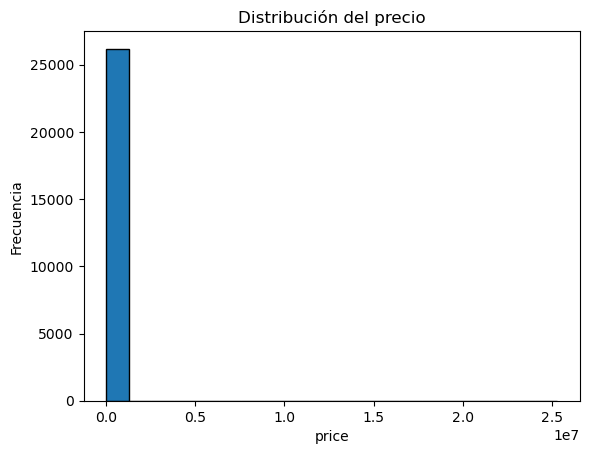

In [26]:
plt.hist(data['price'], bins=20, edgecolor='k')
plt.title('Distribución del precio')
plt.xlabel('price')
plt.ylabel('Frecuencia')
plt.show()

Como se puede observar en el histograma los precios se encuentran desorbitados por lo cual se debe realizar un procesamiento que permita quitar los valores atípicos y de esa manera realizar la normalización de la muestra.

# Análisis Univariado Mínimo de noches

In [27]:
#Conteo por frecuencias de los valores del mínimo de noches
category_counts = data['minimum_nights'].value_counts()
print("Frecuencia de cada categoría:")
category_counts.sort_values(ascending=False)

Frecuencia de cada categoría:


3       6028
2       5963
1       5906
4       2048
5       1655
7       1545
30       582
6        419
15       359
10       332
14       276
28       213
20       152
90       121
60        86
25        62
21        59
12        44
180       43
8         39
29        32
9         26
13        19
365       19
120       18
18        13
40        12
200       10
31        10
360        7
23         7
100        6
17         5
300        5
70         5
45         4
50         4
359        4
89         4
16         4
22         3
91         3
152        3
19         3
11         3
80         3
150        3
58         2
730        2
160        2
55         2
190        2
183        2
999        2
27         2
75         2
24         2
1000       2
26         2
95         1
74         1
181        1
106        1
350        1
500        1
32         1
35         1
92         1
61         1
140        1
900        1
750        1
Name: minimum_nights, dtype: int64

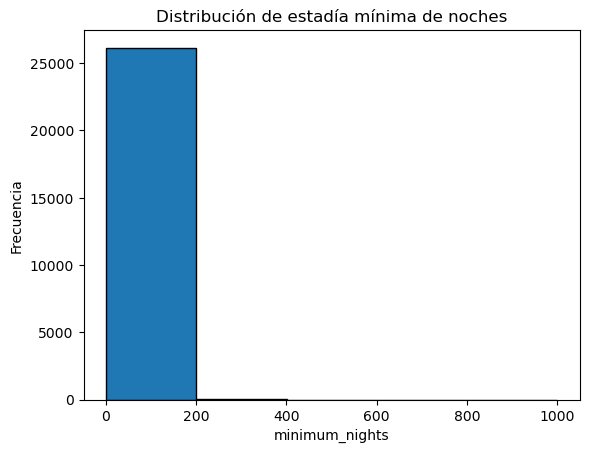

In [28]:
plt.hist(data['minimum_nights'], bins=5, edgecolor='k')
plt.title('Distribución de estadía mínima de noches')
plt.xlabel('minimum_nights')
plt.ylabel('Frecuencia')
plt.show()

In [29]:
data['minimum_nights'].describe()

count    26204.000000
mean         6.300145
std         24.286468
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max       1000.000000
Name: minimum_nights, dtype: float64

Como se puede observar el mínimo de noches exigidas oscila alrededor de 6 sin embargo, el valor máximo probablemente sea 
un valor atípico ya que representa 1000 noches (alrededor de 3 años), por ende, más adelante revisaremos la estrategia
correspondiente frente a estos outliers.

## Análisis Univariado number_of_reviews

In [30]:
category_counts = data['number_of_reviews'].value_counts()
print("Frecuencia de cada categoría:")
category_counts.sort_values(ascending=False)

Frecuencia de cada categoría:


0      4944
1      2176
2      1529
3      1233
4      1016
       ... 
434       1
298       1
281       1
223       1
194       1
Name: number_of_reviews, Length: 323, dtype: int64

In [31]:
data['number_of_reviews'].describe()

count    26204.000000
mean        21.823386
std         38.715892
min          0.000000
25%          1.000000
50%          7.000000
75%         25.000000
max        657.000000
Name: number_of_reviews, dtype: float64

Text(0, 0.5, 'Frecuencia')

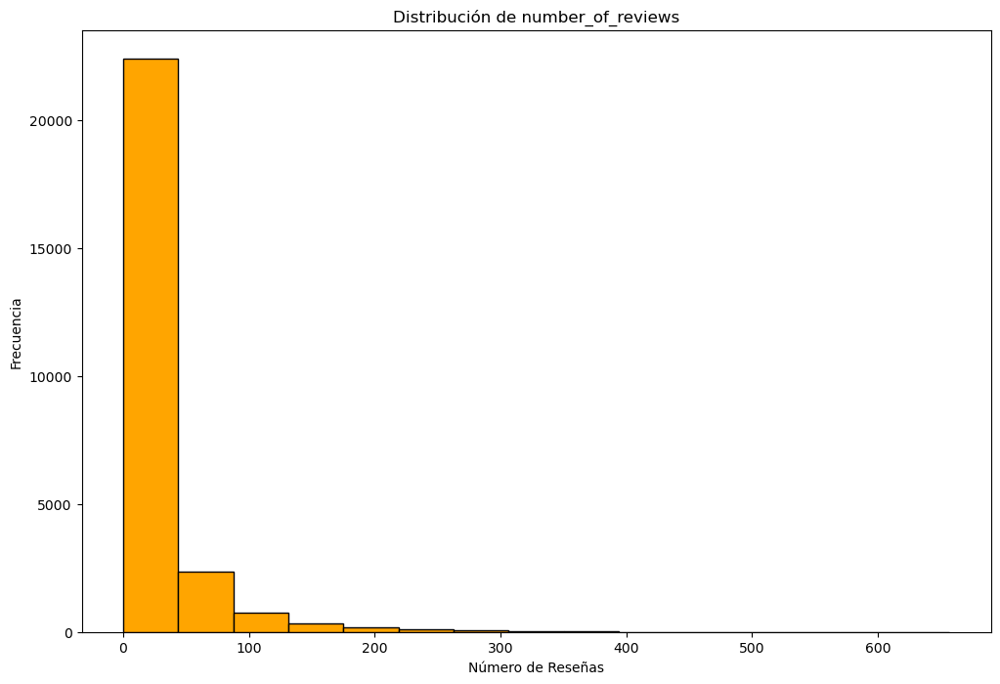

In [32]:
plt.figure(figsize=(12, 8))
plt.hist(data['number_of_reviews'], bins=15, color='Orange', edgecolor='black')
plt.title('Distribución de number_of_reviews')
plt.xlabel('Número de Reseñas')
plt.ylabel('Frecuencia')

La mayoria de reservas por alojamiento se distribuyen entre 0 y 100 por lo cual es importante validar a que se debe este fenómeno ya que puede estar dado por el precio, la ubicación o el tipo de habitación.

## Análisis de Ubicaciones de los inmuebles

In [33]:
#los 15 mayores barrios con alquileres
n = 15
data['neighbourhood_cleansed'].value_counts()[:n].index.tolist()

['Palermo',
 'Recoleta',
 'San Nicolas',
 'Belgrano',
 'Retiro',
 'Monserrat',
 'Almagro',
 'Villa Crespo',
 'Balvanera',
 'San Telmo',
 'Colegiales',
 'Nuñez',
 'Caballito',
 'Chacarita',
 'Constitucion']

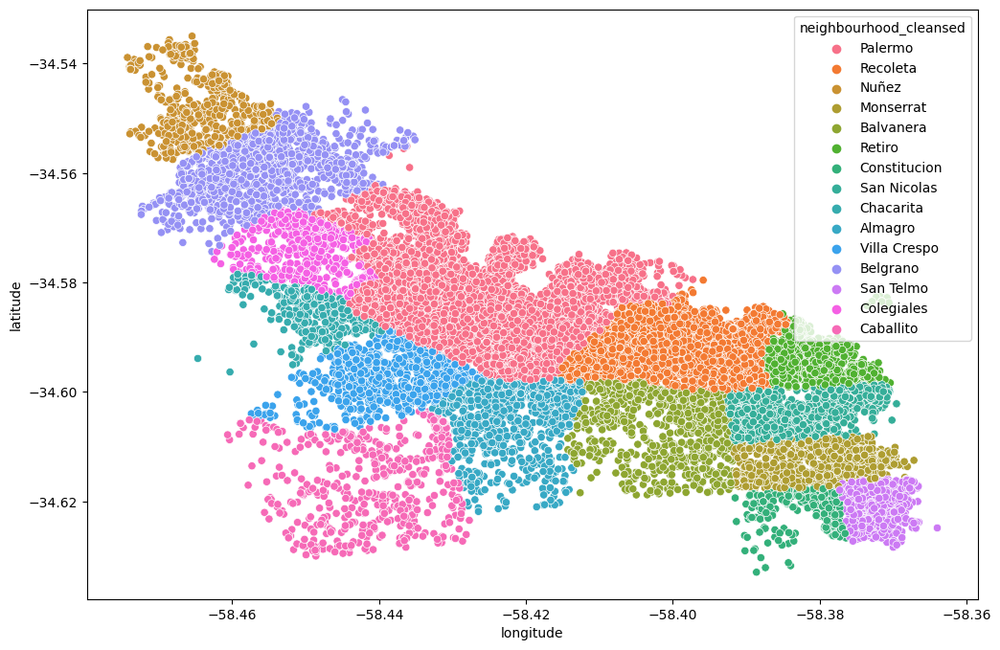

In [34]:
list_nbh = ['Palermo','Recoleta','San Nicolas','Belgrano','Retiro',
 'Monserrat','Almagro','Villa Crespo','Balvanera','San Telmo',
 'Colegiales', 'Nuñez', 'Caballito', 'Chacarita', 'Constitucion']
filtered_data = data.loc[data['neighbourhood_cleansed'].isin(list_nbh)]

import seaborn as sns 
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
sns.scatterplot(x=filtered_data.longitude,y=filtered_data.latitude,hue=filtered_data.neighbourhood_cleansed)
plt.show()

In [35]:
data['neighbourhood_cleansed'].value_counts()

Palermo              8800
Recoleta             3893
San Nicolas          1539
Belgrano             1417
Retiro               1250
Monserrat            1045
Almagro               933
Villa Crespo          890
Balvanera             847
San Telmo             709
Colegiales            623
Nuñez                 601
Caballito             513
Chacarita             431
Constitucion          335
Villa Urquiza         324
Puerto Madero         299
Barracas              205
Saavedra              188
San Cristobal         139
Flores                124
Villa Ortuzar         104
Coghlan                94
Villa Devoto           91
Boca                   88
Boedo                  85
Villa Del Parque       82
Parque Chacabuco       68
Parque Patricios       67
Parque Chas            61
Villa Pueyrredon       54
Paternal               41
Agronomia              40
Floresta               37
Villa Santa Rita       33
Villa Luro             25
Mataderos              21
Villa Gral. Mitre      20
Liniers     

In [36]:
#Revisamos la proporción de imbuebles de estos 15 barrios
category_proportions = data['neighbourhood_cleansed'].value_counts(normalize=True)
print("Proporción de cada categoría:")
print(category_proportions)

Proporción de cada categoría:
Palermo              0.335827
Recoleta             0.148565
San Nicolas          0.058731
Belgrano             0.054076
Retiro               0.047703
Monserrat            0.039879
Almagro              0.035605
Villa Crespo         0.033964
Balvanera            0.032323
San Telmo            0.027057
Colegiales           0.023775
Nuñez                0.022935
Caballito            0.019577
Chacarita            0.016448
Constitucion         0.012784
Villa Urquiza        0.012365
Puerto Madero        0.011410
Barracas             0.007823
Saavedra             0.007174
San Cristobal        0.005305
Flores               0.004732
Villa Ortuzar        0.003969
Coghlan              0.003587
Villa Devoto         0.003473
Boca                 0.003358
Boedo                0.003244
Villa Del Parque     0.003129
Parque Chacabuco     0.002595
Parque Patricios     0.002557
Parque Chas          0.002328
Villa Pueyrredon     0.002061
Paternal             0.001565
Agronomia 

In [37]:
data['neighbourhood_cleansed'].describe()

count       26204
unique         48
top       Palermo
freq         8800
Name: neighbourhood_cleansed, dtype: object

La concentración de más de la mitad de los inmuebles en Buenos Aires se encuentra principalmente en tres barrios, 
Palermo con el 33%, Recoleta con el 14% y San Nicolas con el 5%, en ese sentido, debe evaluarse en nuestra estrategia los
precios de estos inmuebles con el fin de determinar la rentabilidad de los mismos.

## Limpieza de datos

In [38]:
#Análisis de los valores de los precios
#creación de columna con precios en dólares. Precio al 01 de septiembre del 2023 ($1 US == 349.26 ARS)
data["price_dls"]= np.round((data["price"])/349.78,2)

In [39]:
# precios en pesos argentinos
print("- El rango de precios en precios argentinos va de un mínimo de {0} hasta un máximo de {1}, y su promedio es {2}".format(data.price.unique().min(),
                                                                                      data.price.unique().max(),
                                                                 np.round(pd.to_numeric(data.price).mean(), 2)))

# precios en dólares
print("- El rango de precios en dólares va de un mínimo de {0} hasta un máximo de {1}, y su promedio es {2}".format(np.round(data.price_dls.unique().min(), 2),
                                                                                      np.round(data.price_dls.unique().max(), 2),
                                                                 np.round(pd.to_numeric(data.price_dls).mean(), 2)))

- El rango de precios en precios argentinos va de un mínimo de 175.0 hasta un máximo de 25295088.0, y su promedio es 17529.33
- El rango de precios en dólares va de un mínimo de 0.5 hasta un máximo de 72317.14, y su promedio es 50.12


**Resolvemos los precios desorbitados**

In [40]:
data["price_dls"].sort_values(ascending=False)

8145     72317.14
14401    13059.87
13132    12865.23
9020     11541.52
25302    10861.77
           ...   
3994         1.43
5009         1.29
2971         1.14
963          0.74
4373         0.50
Name: price_dls, Length: 26204, dtype: float64

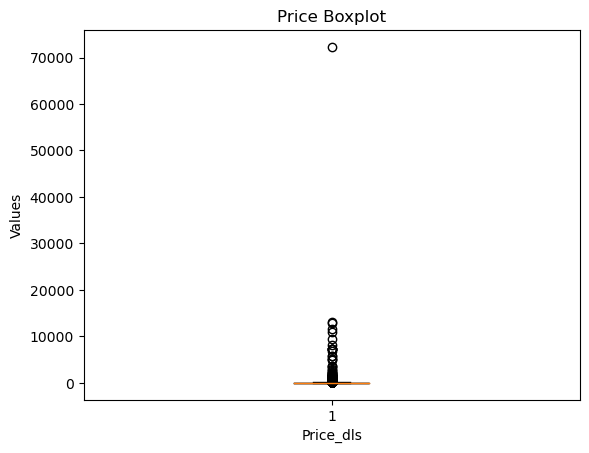

In [41]:
# Corroboramos con el gráfico boxplot para ver estos precios desorbitados muy alejados de la realidad.
plt.boxplot(data = data, x= "price_dls")
plt.title('Price Boxplot')
plt.xlabel('Price_dls')
plt.ylabel('Values')
plt.show()

In [42]:
# Trataremos los precios desorbitados como errores y procedemos a limpiar los valores atípicos para la columna price.

def eliminar_outliers_columna(dataset, columna):
    # Calcular los cuartiles
    Q1 = dataset[columna].quantile(0.25)
    Q3 = dataset[columna].quantile(0.75)
    IQR = Q3 - Q1

    # Identificar los outliers
    outliers = (dataset[columna] < (Q1 - 1.5 * IQR)) | (dataset[columna] > (Q3 + 1.5 * IQR))
    
    # Eliminar los outliers
    dataset_sin_outliers = dataset[~outliers]
    return dataset_sin_outliers

In [43]:
#Aplicamos la función creando un nuevo dataframe llamado data_cleaned
data_cleaned = eliminar_outliers_columna(data, "price_dls")

In [44]:
data_cleaned.shape

(24146, 71)

Los registros iniciales corresponden a 26.204 y quitando los outliers de la variable precio, nuestro dataset corresponde a 24.146 registros

In [45]:
# Comprobamos que ahora no existen casas de 72K dólares la noche.
data_cleaned["price_dls"].sort_values(ascending=False)

7944     77.48
15489    77.43
136      77.40
25000    77.22
15840    77.22
         ...  
3994      1.43
5009      1.29
2971      1.14
963       0.74
4373      0.50
Name: price_dls, Length: 24146, dtype: float64

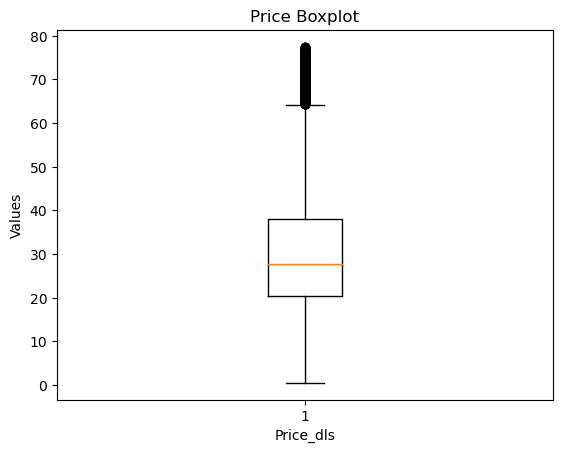

In [46]:
# Volvemos a comprobar el gráfico boxplot de la variable price
plt.boxplot(data = data_cleaned, x= "price_dls")
plt.title('Price Boxplot')
plt.xlabel('Price_dls')
plt.ylabel('Values')
plt.show()

In [47]:
data_cleaned["price_dls"].describe()

count    24146.000000
mean        30.946742
std         14.886154
min          0.500000
25%         20.450000
50%         27.680000
75%         37.980000
max         77.480000
Name: price_dls, dtype: float64

In [48]:
# precios en dólares
print("- El rango de precios en dólares va de un mínimo de {0} hasta un máximo de {1}, y su promedio es {2}".format(np.round(data_cleaned.price_dls.unique().min(), 2),
                                                                                      np.round(data_cleaned.price_dls.unique().max(), 2),
                                                                 np.round(pd.to_numeric(data_cleaned.price_dls).mean(), 2)))

- El rango de precios en dólares va de un mínimo de 0.5 hasta un máximo de 77.48, y su promedio es 30.95


**Observamos la distribución del precio**

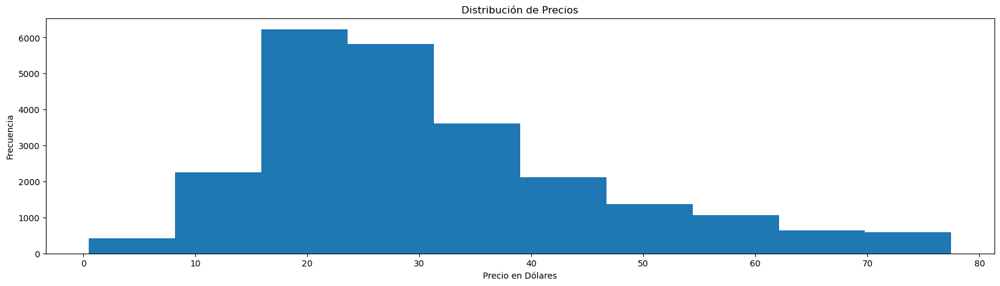

In [49]:
plt.figure(figsize=(20, 5))
plt.hist(data_cleaned["price_dls"], bins=10)  # Especifica la columna "price_dls"
plt.title("Distribución de Precios")
plt.xlabel("Precio en Dólares")
plt.ylabel("Frecuencia")
plt.show()

**Resolvemos el minimo de noches que posiblemente sean outliers**

[minumum_nights] valores por encima de 365 días: 356 registros


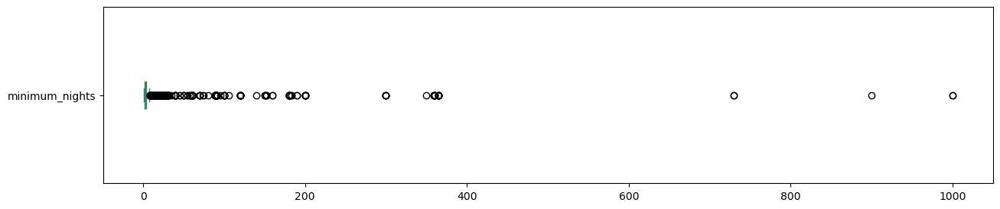

In [50]:
data_cleaned.minimum_nights.plot(kind='box',vert=False, figsize=(15,3))
print('[minumum_nights] valores por encima de 365 días: {} registros'.format(len(data_cleaned[data_cleaned.minimum_nights>30])))

In [51]:
data_cleaned.drop(data_cleaned[data_cleaned.minimum_nights>30].index, axis=0, inplace=True)

C:\Users\danil\AppData\Local\Temp\ipykernel_21868\495551574.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned.drop(data_cleaned[data_cleaned.minimum_nights>30].index, axis=0, inplace=True)


In [52]:
print('[minumum_nights] valores por encima de 365 días: {} registros'.format(len(data_cleaned[data_cleaned.minimum_nights>30])))

[minumum_nights] valores por encima de 365 días: 0 registros


In [53]:
data_cleaned.shape

(23790, 71)

Después de extraer los outliers del mínimo de noches que no son lógicas nuestra dataset pasa de 24.146 a 23.790 registros

In [54]:
data_cleaned['minimum_nights'].describe()

count    23790.000000
mean         4.284237
std          5.658541
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         30.000000
Name: minimum_nights, dtype: float64

Como se puede observar el mínimo de noches es de 1 y el maximo es de 30 donde la media de noches por propiedad es de alrededor de 4 noches.

# Limpieza de datos DataSet Calendar

In [55]:
# Quitamos las "," de las columnas "price" y "adjusted_price"
calendar["price"] = calendar["price"].str.replace(",", "")
calendar["adjusted_price"] = calendar["adjusted_price"].str.replace(",", "")

# Quitamos el símbolo "$" de las columnas "price" y "adjusted_price" y las convertimos a tipo float
calendar["price"] = calendar["price"].str.strip('$').astype(float)
calendar["adjusted_price"] = calendar["adjusted_price"].str.strip('$').astype(float)

# Convertimos la columna 'date' a datetime si aún no lo está
calendar['date'] = pd.to_datetime(calendar['date'])

# Creamos una columna de mes
calendar['month'] = calendar['date'].dt.month

# Convertimos la columna 'available' a binario
calendar['available'] = calendar['available'].replace({'f': 0, 't': 1})


# Comprobamos los cambios
calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,month
0,11508,2023-06-29,0,16608.0,16608.0,3.0,1125.0,6
1,11508,2023-06-30,0,19163.0,19163.0,3.0,1125.0,6
2,11508,2023-07-01,0,19163.0,19163.0,3.0,1125.0,7
3,11508,2023-07-02,0,16608.0,16608.0,3.0,1125.0,7
4,11508,2023-07-03,0,16608.0,16608.0,3.0,1125.0,7


In [56]:
#Ajustamos los precios para que puedan ser usados como precios en dólares
calendar["price_dls"]= np.round((calendar["price"])/349.78,2)
calendar["price_dls_ajusted"]= np.round((calendar["adjusted_price"])/349.78,2)

In [57]:
calendar

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,month,price_dls,price_dls_ajusted
0,11508,2023-06-29,0,16608.0,16608.0,3.0,1125.0,6,47.48,47.48
1,11508,2023-06-30,0,19163.0,19163.0,3.0,1125.0,6,54.79,54.79
2,11508,2023-07-01,0,19163.0,19163.0,3.0,1125.0,7,54.79,54.79
3,11508,2023-07-02,0,16608.0,16608.0,3.0,1125.0,7,47.48,47.48
4,11508,2023-07-03,0,16608.0,16608.0,3.0,1125.0,7,47.48,47.48
...,...,...,...,...,...,...,...,...,...,...
9564442,923267707537096994,2024-06-23,1,21718.0,21718.0,1.0,365.0,6,62.09,62.09
9564443,923267707537096994,2024-06-24,1,21718.0,21718.0,1.0,365.0,6,62.09,62.09
9564444,923267707537096994,2024-06-25,1,21718.0,21718.0,1.0,365.0,6,62.09,62.09
9564445,923267707537096994,2024-06-26,1,21718.0,21718.0,1.0,365.0,6,62.09,62.09


In [58]:
#No olvidamos eliminar los outliers en el precio de acuerdo a lo función que previamente definimos

calendar = eliminar_outliers_columna(calendar, "price_dls")

## Estrategia de análisis

# ***Correlación entre variables***

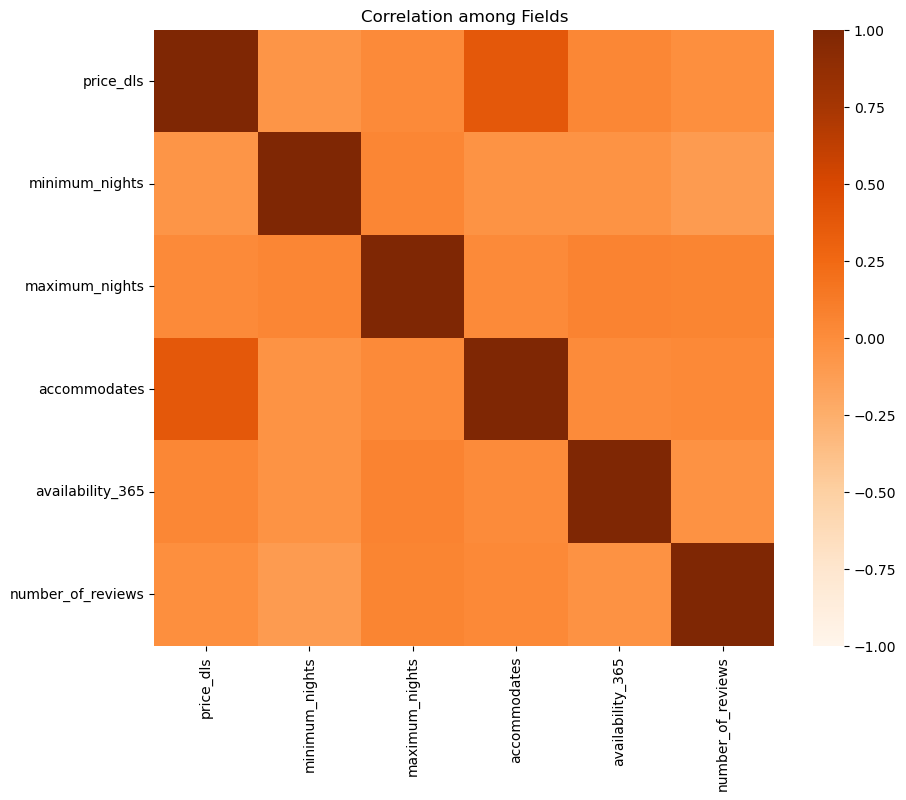

In [59]:
# Validamos la correlación entre las variables especificas.
plt.figure(figsize=(10, 8))
sns.heatmap(
    data_cleaned[["price_dls","minimum_nights","maximum_nights","accommodates","availability_365","number_of_reviews"]].corr(),
    vmin=-1, vmax=1,
    cmap="Oranges"
)
plt.title("Correlation among Fields")
plt.show()

Como se puede observar en la matriz las variables que tienen una mayor correlación son los precios y los accommodates. Lo validaremos con el test de correlación de Sperman

In [60]:
from scipy.stats import spearmanr

stat, p = spearmanr(data_cleaned["price_dls"], data_cleaned["accommodates"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=0.422, p=0.000
Probablemente dependientes


In [61]:
# Y aquí lo comprobamos gráficamente
fig = px.scatter(data_cleaned, x = "price_dls", y = "accommodates", trendline = "ols", trendline_color_override="#ff8000")
fig.show()

Podemos observar que efectivamente los precios y las acomodaciones individuales tienen una correlación directa ya a que medida que aumenta las acomodaciones aumentan el precio de las habitaciones, sin embargo no es una relación estrictamente fuerte lo que sugiere que el precio está influido de igual manera por otros factores.

# ***Barrios con mayores Alojamientos en Buenos Aires***

In [62]:
#Validamos los barrios que tienen acomodaciones en Airbnb
print("- Las distintos barrios de Buenos Aires con algún alquiler por Airbnb:")
for i in data_cleaned.neighbourhood_cleansed.unique():
    print("    * "+i)


- Las distintos barrios de Buenos Aires con algún alquiler por Airbnb:
    * Palermo
    * Recoleta
    * Nuñez
    * Monserrat
    * Balvanera
    * Retiro
    * Constitucion
    * Barracas
    * San Nicolas
    * Chacarita
    * Almagro
    * Villa Crespo
    * Belgrano
    * Coghlan
    * San Cristobal
    * Villa Urquiza
    * San Telmo
    * Boedo
    * Colegiales
    * Boca
    * Caballito
    * Puerto Madero
    * Villa Luro
    * Villa Devoto
    * Saavedra
    * Parque Chacabuco
    * Monte Castro
    * Villa Ortuzar
    * Villa Gral. Mitre
    * Velez Sarsfield
    * Flores
    * Parque Patricios
    * Villa Del Parque
    * Floresta
    * Paternal
    * Villa Pueyrredon
    * Villa Santa Rita
    * Liniers
    * Agronomia
    * Parque Avellaneda
    * Villa Real
    * Parque Chas
    * Villa Lugano
    * Versalles
    * Nueva Pompeya
    * Villa Riachuelo
    * Villa Soldati
    * Mataderos


In [63]:
barrios_feq = data_cleaned["neighbourhood_cleansed"].value_counts().head(20)
fig = px.bar(barrios_feq, x=barrios_feq.index, y=barrios_feq.values,
             title="TOP 20 de barrios con más casas en Airbnb",
             hover_data=['neighbourhood_cleansed'],
             color_discrete_sequence=["#ff5a60"],
             labels={'index':'Barrios de Buenos Aires', 'y':'Número de casas de Airbnb'})

fig.show()

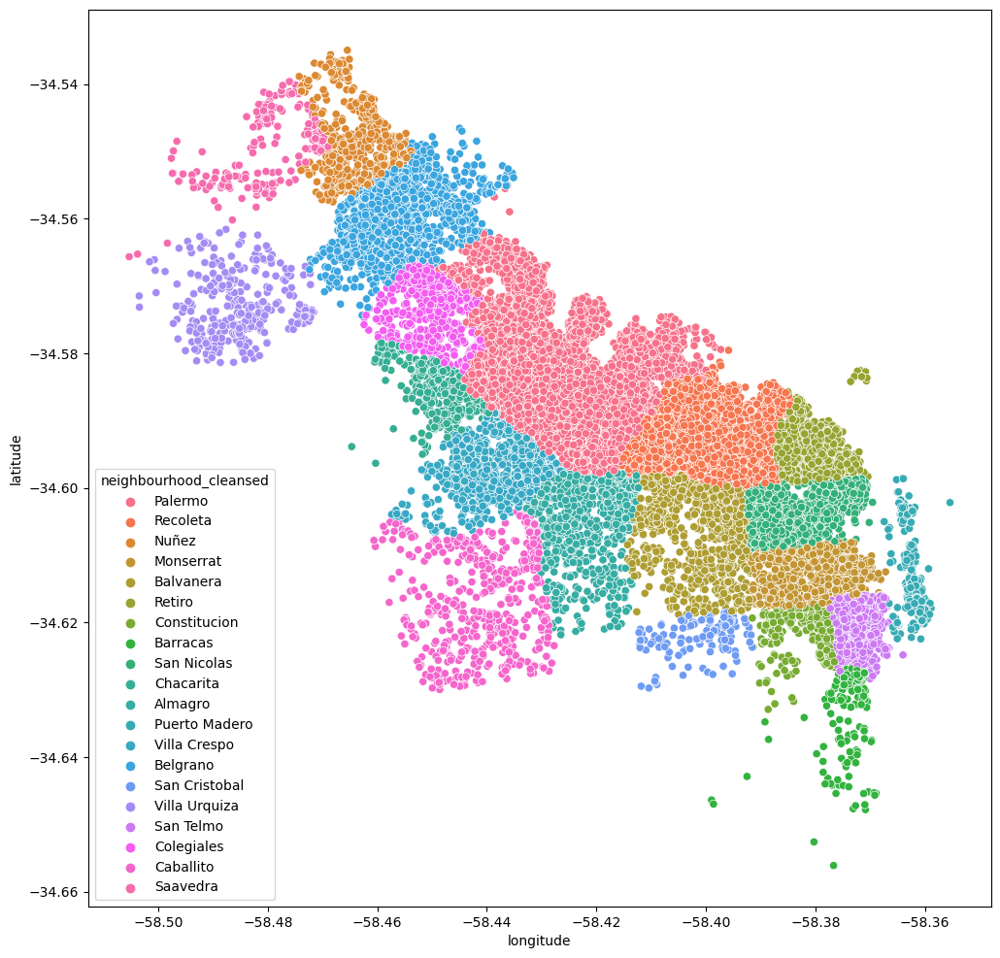

In [64]:
list_nbh = ['Palermo','Recoleta','San Nicolas','Belgrano','Retiro',
 'Monserrat','Almagro','Villa Crespo','Balvanera','San Telmo',
 'Colegiales', 'Nuñez', 'Caballito', 'Chacarita', 'Constitucion','Villa Urquiza',
            'Barracas','Saavedra','Puerto Madero','San Cristobal']
filtered_data = data.loc[data['neighbourhood_cleansed'].isin(list_nbh)]

import seaborn as sns 
import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))
sns.scatterplot(x=filtered_data.longitude,y=filtered_data.latitude,hue=filtered_data.neighbourhood_cleansed)
plt.show()

Como se puede observar en el Mapa la mayor concentración de alojamientos se encuentra en Palermo, seguido por Recoleta y San Nicolas, esto se debe principalmente a su ubicación geográfica ya que se encuentra cerca del aeropuerto y cerca del centro de la ciudad

# ***Precio Medio Alto por barrio***

**Precio sin importar la capacidad de los inquilinos**

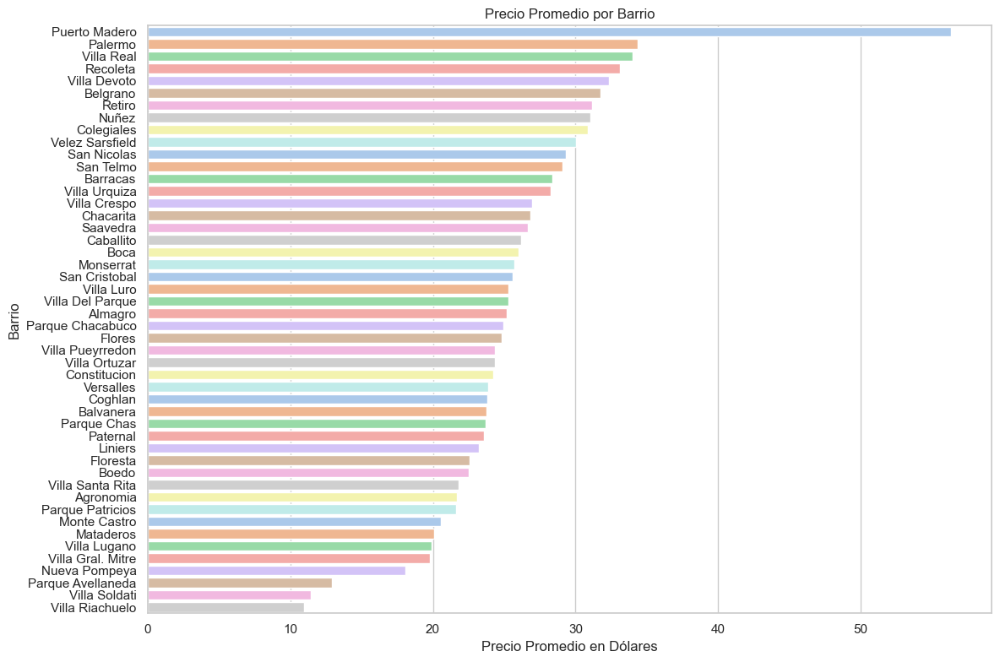

In [65]:

# Calcular el precio promedio por barrio y ordenar de mayor a menor
precio_promedio_por_barrio = data_cleaned.groupby('neighbourhood_cleansed')['price_dls'].mean().reset_index()
precio_promedio_por_barrio = precio_promedio_por_barrio.sort_values(by='price_dls', ascending=False)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Configurar el tamaño de la figura
plt.figure(figsize=(12, 8))

# Crear el gráfico de barras con colores suaves
palette = sns.color_palette("pastel")
sns.barplot(x="price_dls", y="neighbourhood_cleansed", data=precio_promedio_por_barrio, palette=palette)

# Configurar el título y las etiquetas
plt.xlabel("Precio Promedio en Dólares")
plt.ylabel("Barrio")
plt.title("Precio Promedio por Barrio")

# Mostrar el gráfico
plt.tight_layout()
plt.show()


In [66]:
precio_promedio_por_barrio

,neighbourhood_cleansed,price_dls
26,Puerto Madero,56.350491
20,Palermo,34.379431
43,Villa Real,34.025000
27,Recoleta,33.096573
37,Villa Devoto,32.324744
4,Belgrano,31.726659
28,Retiro,31.184300
19,Nuñez,31.061949
10,Colegiales,30.893958
33,Velez Sarsfield,30.047647


**Precio Promedio para alojamientos de 1 solo inquilino y parejas**

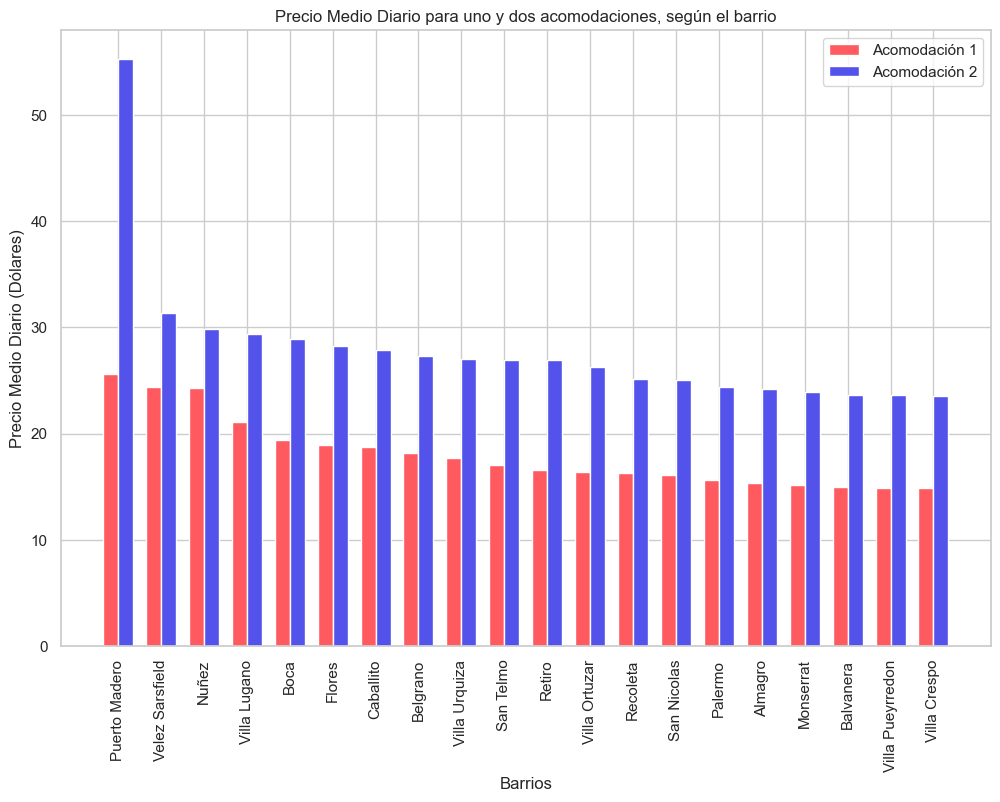

In [67]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar los datos para accommodates == 1 y 2
barrios_precios_feq = data_cleaned[data_cleaned['accommodates'] == 1]
barrios_precios_feq2 = data_cleaned[data_cleaned['accommodates'] == 2]

# Calcular el precio medio diario para ambos grupos
barrios_precios_feq = barrios_precios_feq.groupby('neighbourhood_cleansed')['price_dls'].mean().sort_values(ascending=False).head(20)
barrios_precios_feq2 = barrios_precios_feq2.groupby('neighbourhood_cleansed')['price_dls'].mean().sort_values(ascending=False).head(20)

# Combinar los resultados en un solo DataFrame
df_combined = pd.DataFrame({
    'Barrio': barrios_precios_feq.index,
    'Acomodación 1': barrios_precios_feq.values,
    'Acomodación 2': barrios_precios_feq2.values
})

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Configurar el tamaño de la figura
plt.figure(figsize=(12, 8))

# Crear el gráfico de barras agrupadas utilizando Matplotlib
width = 0.35
x = range(len(df_combined))
plt.bar(x, df_combined['Acomodación 1'], width, label='Acomodación 1', color='#ff5a60')
plt.bar([i + width for i in x], df_combined['Acomodación 2'], width, label='Acomodación 2', color='#5353ec')

# Configurar el eje x
plt.xticks([i + width/2 for i in x], df_combined['Barrio'], rotation=90)

# Configurar el título y las etiquetas
plt.xlabel("Barrios")
plt.ylabel("Precio Medio Diario (Dólares)")
plt.title("Precio Medio Diario para uno y dos acomodaciones, según el barrio")

# Mostrar la leyenda
plt.legend()

# Mostrar el gráfico
plt.show()



In [68]:
df_combined

,Barrio,Acomodación 1,Acomodación 2
0,Puerto Madero,25.560000,55.221319
1,Velez Sarsfield,24.371667,31.328997
2,Nuñez,24.314375,29.870000
3,Villa Lugano,21.120000,29.367664
4,Boca,19.371667,28.902222
5,Flores,18.948333,28.246267
6,Caballito,18.732083,27.823921
7,Belgrano,18.169833,27.256598
8,Villa Urquiza,17.652500,27.059500
9,San Telmo,17.037500,26.935833


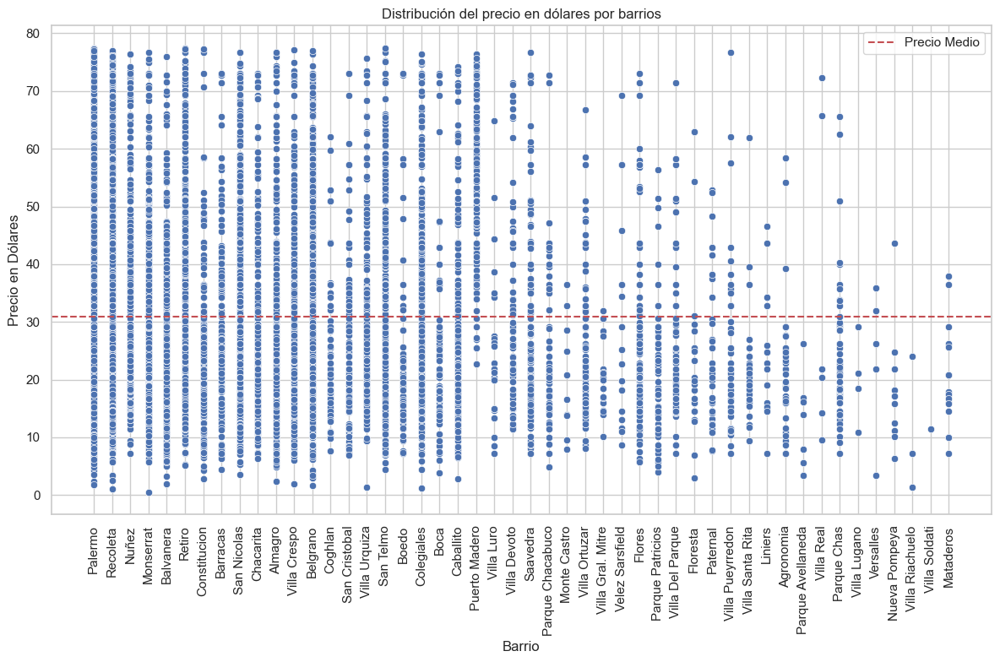

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular el precio medio en dólares
precio_medio = data_cleaned['price_dls'].mean()

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Configurar el tamaño de la figura
plt.figure(figsize=(12, 8))

# Crear el gráfico de dispersión utilizando Seaborn
sns.scatterplot(x="neighbourhood_cleansed", y="price_dls", data=data_cleaned, palette="Set1")

# Agregar una línea horizontal para el precio medio
plt.axhline(y=precio_medio, color='r', linestyle='--', label='Precio Medio')

# Configurar el título y las etiquetas
plt.xlabel("Barrio")
plt.ylabel("Precio en Dólares")
plt.title("Distribución del precio en dólares por barrios")

# Rotar etiquetas del eje x para mayor claridad
plt.xticks(rotation=90)

# Mostrar la leyenda
plt.legend()

# Mostrar el gráfico
plt.tight_layout()
plt.show()



Como se puede observar Puerto Madero es uno de los barrios más costosos de Buenos Aires, ya que su precio medio en dólares, en la mayoria de los casos supera el precio medio de la ciudad, mientras que barrios como Palermo o Recoleta ofrecen diferentes tipos de precios a sus usuarios, esto debido a que son los barrios con mayor cantidad de alojamientos en la ciudad.

# ***Tipo de Alojamiento***

**Tipos de Alojamiento más comunes de encontrar en la ciudad**

In [70]:
room_type_counts= data_cleaned['room_type'].value_counts()
# Crear el gráfico de tarta
fig = px.pie(room_type_counts, values=room_type_counts.values, names=room_type_counts.index,
             title='Distribución de tipos de habitación')

# Mostrar el gráfico
fig.show()

In [71]:
top_neighbourhoods = data_cleaned['neighbourhood_cleansed'].value_counts().head(20).index
listings_top_n = data_cleaned[data_cleaned['neighbourhood_cleansed'].isin(top_neighbourhoods)]

In [72]:
#Tipo de alojamiento según el barrio
# Agrupar los datos por barrio y tipo de habitación, y contar la cantidad de cada tipo de habitación en cada barrio
room_type_counts = listings_top_n.groupby(['neighbourhood_cleansed', 'room_type']).size().reset_index(name='counts')

# Ordenar el DataFrame por la columna 'counts' en orden descendente
room_type_counts = room_type_counts.sort_values(by='counts', ascending=False)

# Crear el gráfico de barras
fig = px.bar(room_type_counts, x='neighbourhood_cleansed', y='counts', color='room_type', barmode='relative',
             labels={'counts':'Número de propiedades', 'neighbourhood':'Vecindario', 'room_type':'Tipo de habitación'},
             title='Distribución de los tipos de habitación en los 20 barrios con más propiedades')
fig.show()

In [73]:

print("Habitación más común en cada uno de los barrios: \n")

# Iterar a través de los vecindarios únicos
for neighbourhood_cleansed in data_cleaned['neighbourhood_cleansed'].unique():
    # Filtrar el DataFrame para el vecindario actual
    neighbourhood_data = data_cleaned[data_cleaned['neighbourhood_cleansed'] == neighbourhood_cleansed]
    
    # Obtener el tipo de habitación más común y su conteo
    most_common_room_type = neighbourhood_data['room_type'].value_counts().idxmax()
    count = neighbourhood_data['room_type'].value_counts().max()
    
    print("{}: {} - entries: {}".format(neighbourhood_cleansed, most_common_room_type, count))


Habitación más común en cada uno de los barrios: 

Palermo: Entire home/apt - entries: 7315
Recoleta: Entire home/apt - entries: 3247
Nuñez: Entire home/apt - entries: 525
Monserrat: Entire home/apt - entries: 793
Balvanera: Entire home/apt - entries: 595
Retiro: Entire home/apt - entries: 1030
Constitucion: Entire home/apt - entries: 260
Barracas: Entire home/apt - entries: 141
San Nicolas: Entire home/apt - entries: 1312
Chacarita: Entire home/apt - entries: 344
Almagro: Entire home/apt - entries: 761
Villa Crespo: Entire home/apt - entries: 735
Belgrano: Entire home/apt - entries: 1185
Coghlan: Entire home/apt - entries: 73
San Cristobal: Entire home/apt - entries: 92
Villa Urquiza: Entire home/apt - entries: 281
San Telmo: Entire home/apt - entries: 554
Boedo: Entire home/apt - entries: 57
Colegiales: Entire home/apt - entries: 523
Boca: Entire home/apt - entries: 55
Caballito: Entire home/apt - entries: 423
Puerto Madero: Entire home/apt - entries: 162
Villa Luro: Entire home/apt 

Podemos observar que los barrios que ofrecen habitaciones privadas son aquellos barrios que a su vez tienen el menor precio en general de sus habitaciones, de igual forma se identifica que la habitación predilecta en la mayoria de los barrios y la cual se vende más son aquellas que ofrecen el alojamiento completo sea apartamento o casa 

**Costo de las habitaciones**

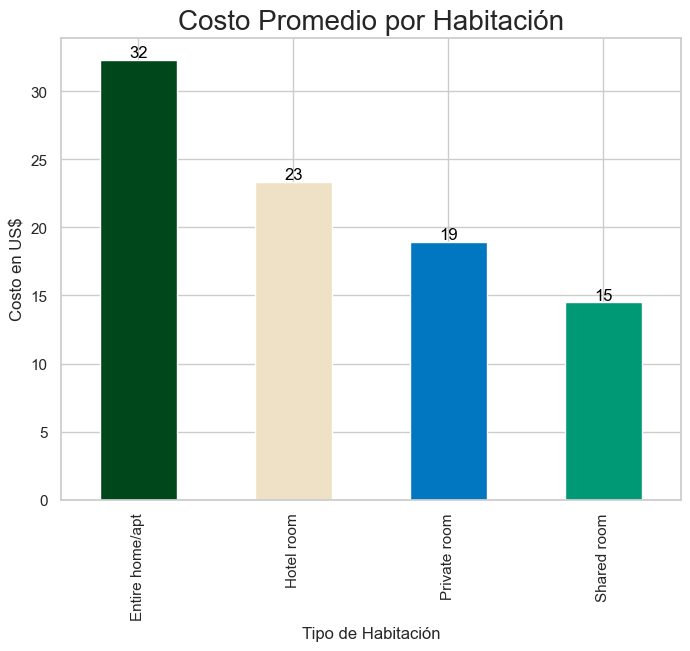

In [74]:
# Group the data by the room type
room_types = data_cleaned.groupby('room_type')

# Find out the mean value of the prices in each room type
prices = room_types['price_dls'].mean().sort_values(ascending=False)

# Create the bar plot
ax = prices.plot(kind='bar', color=['#00471b', '#eee1c6', '#0077c0', '#009975'], figsize=(8, 6))

# Add rounded data labels above each bar
for p in ax.patches:
    ax.annotate(f'{round(p.get_height(), )}',  # Redondear a 2 decimales
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.title('Costo Promedio por Habitación', fontsize=20)
plt.xlabel('Tipo de Habitación')
plt.ylabel('Costo en US$')
plt.show()



Como se puede evidenciar la habitación más costosa es aquella en la cual se renta el apartamento o casa completa con un precio promedio de 32 dólares, seguido de las habitaciones de hotel que no son las preferidas ya que del total corresponden al 3%, luego de esta se encuentran las habitaciones privadas con un precio de 19 dolares y las habitaciones compartidas con un precio promedio de 15 dólares 

In [75]:
room_types = data_cleaned['room_type'].value_counts().keys()
print("Numero de personas promedio por habitación: \n")
for room_type in room_types:
    print("{}: {}".format(room_type, round(data_cleaned.loc[data_cleaned['room_type'] == room_type]['accommodates'].mean())))

Numero de personas promedio por habitación: 

Entire home/apt: 3
Private room: 2
Shared room: 2
Hotel room: 2


Se puede evidenciar que las habitaciones donde pueden haber más personas disponibles o acomodadas son las que rentan el apartamento/ casa completo lo cual implica cierta lógica ya que son espacios más grandes que las habitaciones de Hotel o los cuartos compartidos

# **EVOLUCIÓN DEL PRECIO y DISPONIBILIDAD**

In [76]:
#Definimos los meses
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
# Obtenemos la media de cada mes para poder realizar el gráfico de a continuación
df_monthly = calendar.groupby('month').mean()
#Creamos el gráfico
fig = px.line(df_monthly, x=df_monthly.index, y="price_dls_ajusted",title='Evolución del precio por mes')
fig.update_xaxes(tickvals=list(range(1,13)), ticktext=meses)
fig.show()

Los precios promedio más altos corresponden a los mensajes de temporada vacional como lo son noviembre, diciembre, enero y febrero. Por su parte a partir de abril, los precios empiezan a tener una disminución siendo para el caso de Buenos Aires el mes de Julio el que conserva el precio promedio más bajo, sin embargo, a partir de este mes dichos precios comienzan a ascender.

In [77]:
grouped_df = calendar.groupby('month').mean().reset_index()
fig = px.line(grouped_df, x='month', y='available', title='Promedio de disponibilidad por mes')
fig.update_xaxes(tickvals=list(range(1,13)), ticktext=meses)
fig.show()

In [78]:
grouped_df

,month,listing_id,available,price,adjusted_price,minimum_nights,maximum_nights,price_dls,price_dls_ajusted
0,1,4.238086e+17,0.546589,12124.459170,12104.823727,6.260400,628795.786079,34.662852,34.606737
1,2,4.238361e+17,0.556867,12137.696473,12109.519628,6.252197,628290.664284,34.700699,34.620164
2,3,4.237150e+17,0.551413,12137.359098,12104.129480,6.254814,629394.376418,34.699736,34.604751
3,4,4.235473e+17,0.522988,12105.033904,12069.092148,6.245595,628450.495323,34.607325,34.504584
4,5,4.237162e+17,0.527275,12086.326943,12044.026570,6.241648,627250.326627,34.553847,34.432928
5,6,4.238831e+17,0.509390,11988.371748,11943.199726,6.218439,625701.878908,34.273797,34.144667
6,7,4.255234e+17,0.468900,11627.652921,11619.739502,6.123023,619636.252164,33.242532,33.219911
7,8,4.249408e+17,0.681815,11717.867598,11697.907226,6.211854,620176.901165,33.500440,33.443386
8,9,4.244310e+17,0.726105,11747.225984,11726.465989,6.227874,622692.032798,33.584365,33.525024
9,10,4.235513e+17,0.646016,11835.560236,11813.848818,6.256400,626947.017928,33.836914,33.774855


Teniendo en cuenta la disponibilidad mensual, podemos inferir que Julio es el mes que tiene menor disponibilidad para reservar, solo el 46%, una de las hipotesis es que el precio está relacionado con esta disponibilidad, ya que Julio tiene un precio promedio menor, sin embargo, lo validaremos en una pequeña matriz de correlación.

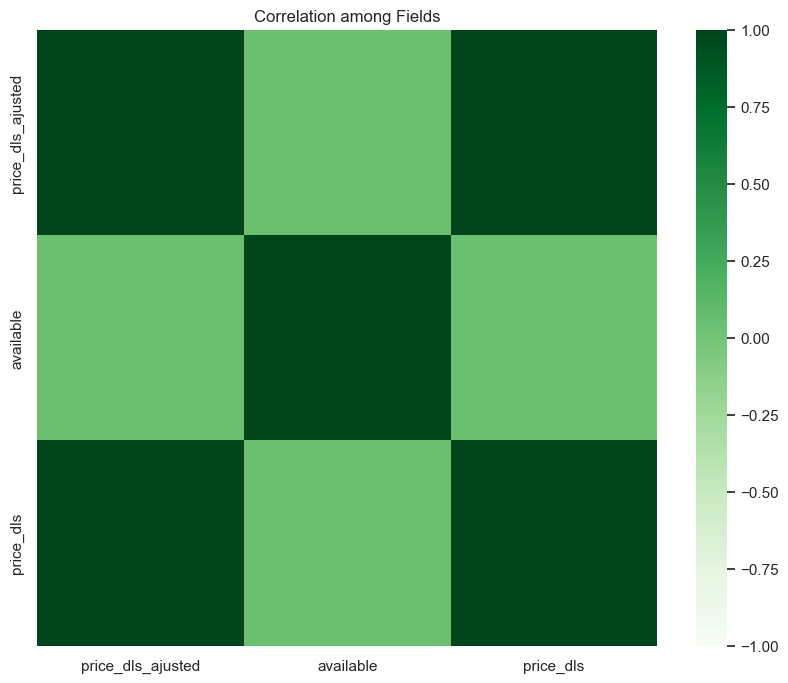

In [79]:
# Validamos la correlación entre las variables especificas.
plt.figure(figsize=(10, 8))
sns.heatmap(
    calendar[["price_dls_ajusted","available","price_dls"]].corr(),
    vmin=-1, vmax=1,
    cmap="Greens"
)
plt.title("Correlation among Fields")
plt.show()

In [80]:
from scipy.stats import spearmanr
stat, p = spearmanr(calendar["price_dls_ajusted"], calendar["available"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=0.053, p=0.000
Probablemente dependientes


Despues de realizar nuestra matriz de correlación nos podemos dar cuenta de que el precio no está correlacionado con la disponibilidad, ya que esta es una correlación muy débil y se encuentra cercana a cero, lo que implica que variaciones en el precio no afectan la disponibilidad para reservar y viceversa.

**Verificamos de acuerdo a esto la disponibilidad en el año**

In [81]:
source_365 = pd.DataFrame(data_cleaned.availability_365.value_counts()).reset_index().rename(columns={"index":"365", "frecuencia":"frequency"})
# number of reviews, general plot
alt.Chart(source_365).mark_bar().encode(
    alt.X('365', title="Número de días"),
    alt.Y('availability_365', title="Frecuencia"),
    alt.Color('365', legend=None),
    tooltip=['365', 'availability_365']
).properties(title="Frecuencia de número de días disponibles en un año")

alt.Chart(...)

En términos de disponibilidad el porcentaje de alojamientos vendidos todo el año es el mayor, seguido de aquellos que se encuentran disponibles todo el año, lo que implica que no venden todas sus acomodaciones. En ese sentido, es relevante identificar cuales son esos barrios donde la mayoria de sus alojamientos ya se encuentran reservados todo el año 

**Disponibilidad por barrio**

In [82]:
# Agrupar por barrio y calcular la frecuencia de disponibilidad anual
barrio_availability = data_cleaned.groupby('neighbourhood_cleansed')['availability_365'].value_counts().reset_index(name='frequency')

# Seleccionar los 20 barrios principales por frecuencia
top_10_barrios = barrio_availability.groupby('neighbourhood_cleansed')['frequency'].sum().nlargest(10).index

# Filtrar los datos para incluir solo los 20 barrios principales
barrio_availability_top_10 = barrio_availability[barrio_availability['neighbourhood_cleansed'].isin(top_10_barrios)]

# Crear una columna 'disponibilidad' para categorizar 0 y 365
barrio_availability_top_10['disponibilidad'] = barrio_availability_top_10['availability_365'].apply(lambda x: '0' if x == 0 else ('365' if x == 365 else 'Otros'))

# Crear un DataFrame con los datos que deseas mostrar en la tabla
tabla_disponibilidad = barrio_availability_top_10[['neighbourhood_cleansed', 'availability_365', 'frequency', 'disponibilidad']]

grupo_disponibilidad_barrio = tabla_disponibilidad.groupby(['disponibilidad', 'neighbourhood_cleansed'])['frequency'].sum().reset_index()


C:\Users\danil\AppData\Local\Temp\ipykernel_21868\1153001008.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



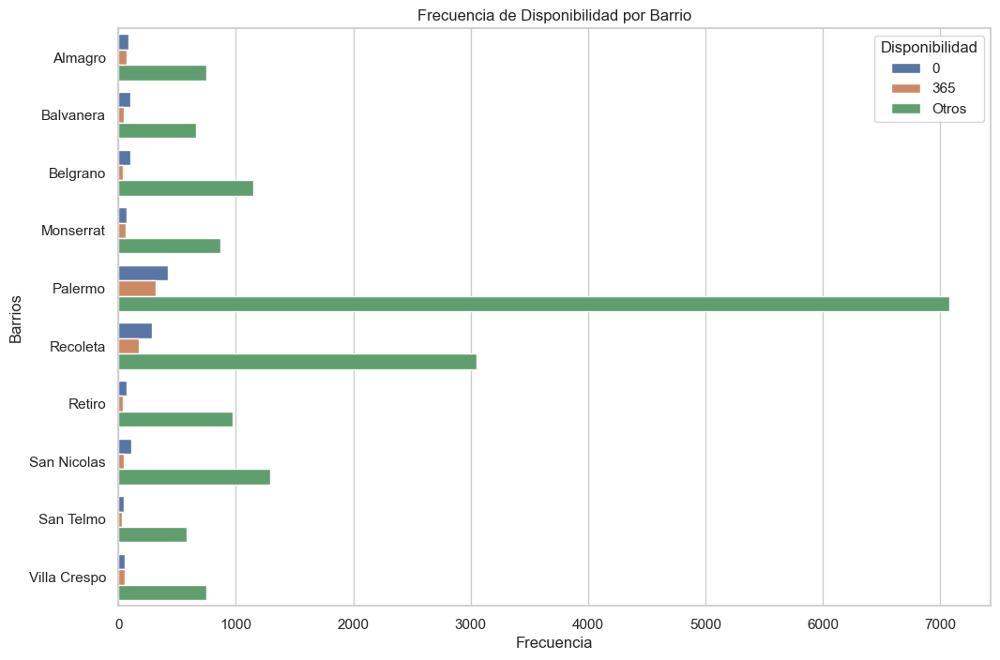

In [83]:
# Supongamos que tienes un DataFrame llamado grupo_disponibilidad_barrio_ordenado con las columnas 'disponibilidad', 'nombre_barrio' y 'frequency'

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(x="frequency", y="neighbourhood_cleansed", hue="disponibilidad", data=grupo_disponibilidad_barrio)

# Configurar el título y las etiquetas
plt.xlabel("Frecuencia")
plt.ylabel("Barrios")
plt.title("Frecuencia de Disponibilidad por Barrio")

# Mostrar la leyenda
plt.legend(title="Disponibilidad")

# Mostrar el gráfico
plt.show()



Los barrios que tienen mayor disponibilidad son Palermo, Recoleta y San Nicolas, esto debido a que son los barrios con mayores alojamientos y de igual forma, son los barrios en los cuales un gran porcentaje de sus alojamientos ya se encuentran reservados todo el año. Sin embargo, la cantidad de alojamientos sin disponibilidad en todo el año es superior a la disponibilidad en todo el año en estos barrios específicos.

# **Análisis de las Reviews**

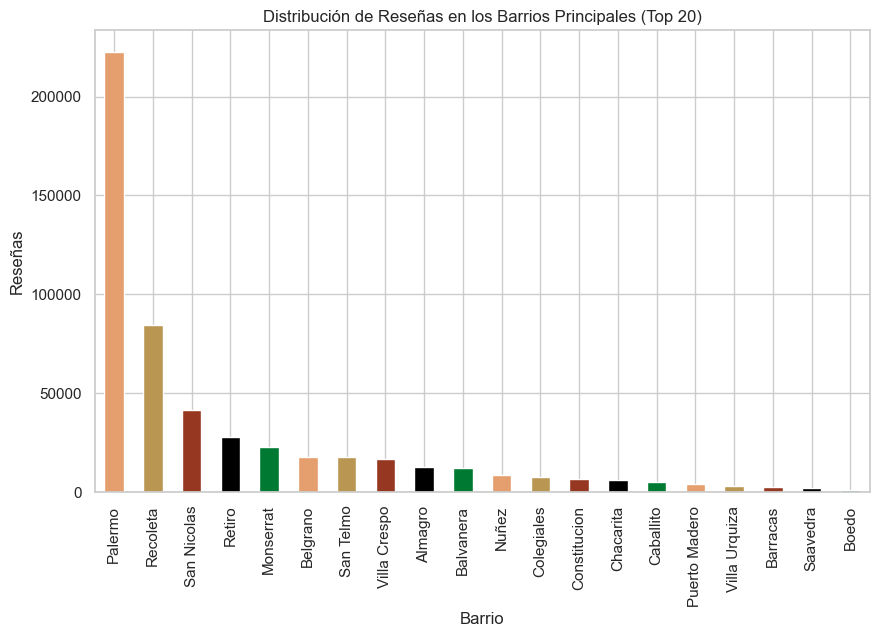

In [84]:
neighs = data_cleaned.groupby('neighbourhood_cleansed')
reviews = neighs['number_of_reviews'].sum().sort_values(ascending=False).head(20)  # Ordenar de mayor a menor y tomar los 20 primeros.

reviews.plot(kind='bar', color=['#e59e6d', '#ba9653', '#963821', 'black', '#007a33'], figsize=(10, 6))
plt.xlabel('Barrio')
plt.ylabel('Reseñas')
plt.title('Distribución de Reseñas en los Barrios Principales (Top 20)')
plt.xticks(rotation=90) 
plt.show()


In [85]:
#Obtenemos la cantidad de reseñas para este top de barrios
list_of_neighs = reviews.keys().tolist()
n_reviews = reviews.tolist()
print("Top 20 neighbourhoods are: \n")
for i,n in enumerate(list_of_neighs):
    print('{} with {} reviews'.format(n, n_reviews[i]))

Top 20 neighbourhoods are: 

Palermo with 222368 reviews
Recoleta with 84684 reviews
San Nicolas with 41789 reviews
Retiro with 27712 reviews
Monserrat with 22925 reviews
Belgrano with 17957 reviews
San Telmo with 17605 reviews
Villa Crespo with 16718 reviews
Almagro with 12729 reviews
Balvanera with 12146 reviews
Nuñez with 8925 reviews
Colegiales with 7882 reviews
Constitucion with 6901 reviews
Chacarita with 5972 reviews
Caballito with 5106 reviews
Puerto Madero with 4421 reviews
Villa Urquiza with 3297 reviews
Barracas with 2788 reviews
Saavedra with 2347 reviews
Boedo with 1210 reviews


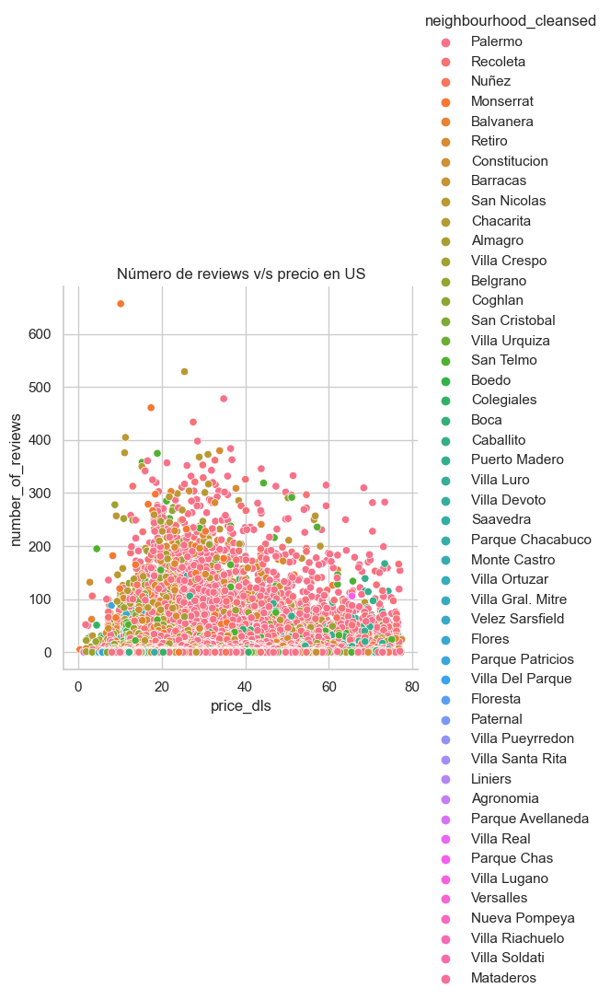

In [86]:
#Validamos esta distribución visualmente
sns.relplot(x='price_dls',y='number_of_reviews',hue='neighbourhood_cleansed',data=data_cleaned)
plt.title('Número de reviews v/s precio en US')
plt.show()

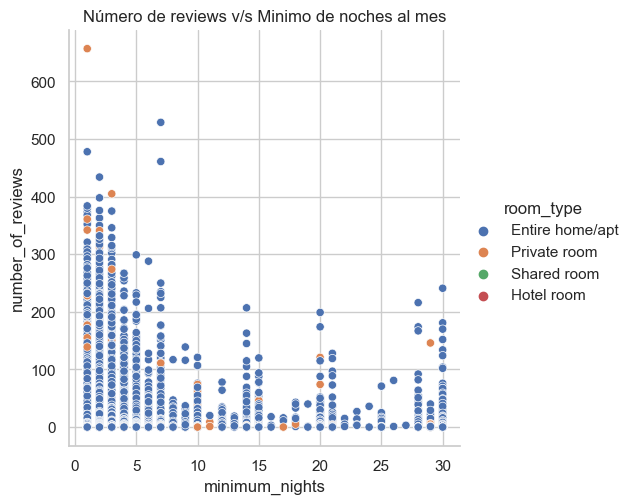

In [87]:
sns.relplot(x='minimum_nights',y='number_of_reviews',hue='room_type',data=data_cleaned)
plt.title('Número de reviews v/s Minimo de noches al mes')
plt.show()

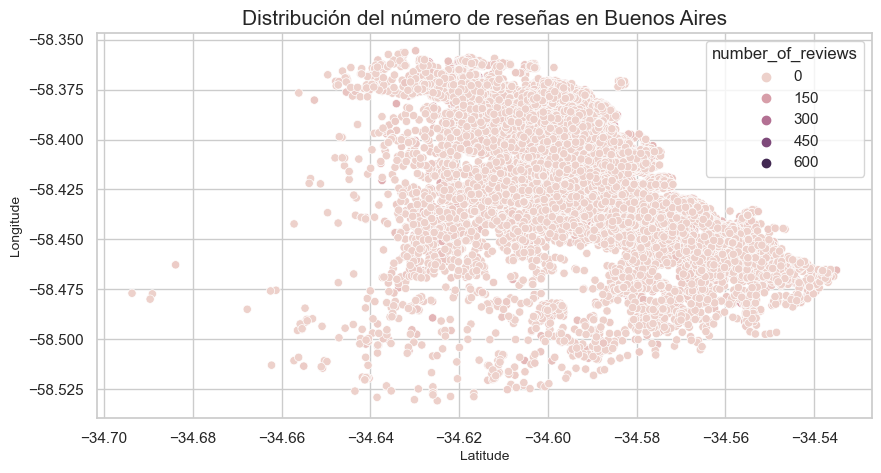

In [88]:
# To see how number of reviews across all location using scatter plot.
plt.figure(figsize=(10,5));
sns.scatterplot(data=data_cleaned,x="latitude",y="longitude",hue="number_of_reviews");plt.xlabel("Latitude",fontsize=10);
plt.title("Distribución del número de reseñas en Buenos Aires",fontsize=15);plt.ylabel("Longitude",fontsize=10);

# PRINCIPALES AMENITIES

In [89]:
import nltk
import re
from nltk.corpus import stopwords
from collections import Counter

nltk.download('stopwords')

def getIndividualAmenities(amenities):
    returnAmen = []
    
    full_text = " ".join(amenities)
    words = re.findall(r'\w+', full_text.lower())
    stop_words = set(stopwords.words('english'))

    nonUtilWords = []  # Define nonUtilWords si no está definida en tu código original

    filter_words = [word for word in words if (word not in stop_words) and (word not in nonUtilWords)]
    word_counter = Counter(filter_words)
    most_common_words = word_counter.most_common(20)

    for word, frequ in most_common_words:
        returnAmen.append(word)
    
    return returnAmen


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\danil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [90]:
from collections import Counter
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

# Supongamos que tienes un DataFrame llamado data_cleaned con una columna 'amenities'

# Tokenización: Dividir cada fila de la columna 'amenities' en palabras
data_cleaned['amenities_tokenized'] = data_cleaned['amenities'].apply(lambda x: x.split(','))

# Obtener una lista plana de todas las palabras de amenities
all_amenities = [amenity.strip() for amenity_list in data_cleaned['amenities_tokenized'] for amenity in amenity_list]

# Filtrar palabras vacías (stop words) si es necesario
stop_words = set(stopwords.words('english'))
filtered_amenities = [word for word in all_amenities if word.lower() not in stop_words]

# Contar la frecuencia de cada palabra
word_counts = Counter(filtered_amenities)

# Imprimir el conteo de palabras más comunes
for palabra, frecuencia in word_counts.most_common(20):
    print(f"{palabra}: {frecuencia} veces")



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\danil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\danil\AppData\Local\Temp\ipykernel_21868\1748882727.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



"Kitchen": 22580 veces
"Wifi": 20579 veces
"Essentials": 19026 veces
"Cooking basics": 17954 veces
"Hangers": 17699 veces
"Dishes and silverware": 17396 veces
"Refrigerator": 16250 veces
"Bed linens": 15919 veces
"Hair dryer": 14851 veces
"Microwave": 13740 veces
"Hot water": 13552 veces
"Elevator": 13215 veces
"Iron": 13212 veces
"Air conditioning": 12502 veces
"Bidet": 12478 veces
"Heating": 12265 veces
"Long term stays allowed": 12037 veces
"Room-darkening shades": 11810 veces
"Extra pillows and blankets": 11514 veces
"TV": 11094 veces


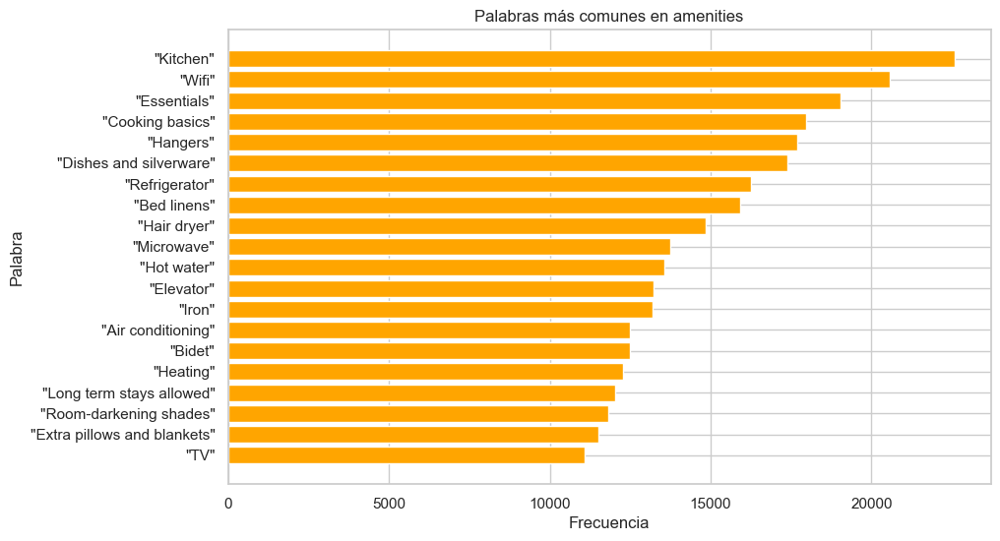

In [91]:
top_words = word_counts.most_common(20)
words, frequencies = zip(*top_words)

# Crear un gráfico de barras horizontal
plt.figure(figsize=(10, 6))
bars = plt.barh(words, frequencies, color='Orange')
plt.xlabel('Frecuencia')
plt.ylabel('Palabra')
plt.title('Palabras más comunes en amenities')
plt.gca().invert_yaxis()  # Invertir el eje y para que las palabras más comunes estén arriba


plt.show()

Se puede observar que los principales servicios que ofrecen los alojamientos son aquellos como la cocina, Wifi, aquellos servicios esenciales (toalla, jabón,papel higiénico,artículos de limpieza, entre otros) y servicios de lavado, al igual que utensisilios indispensables en la cocina.

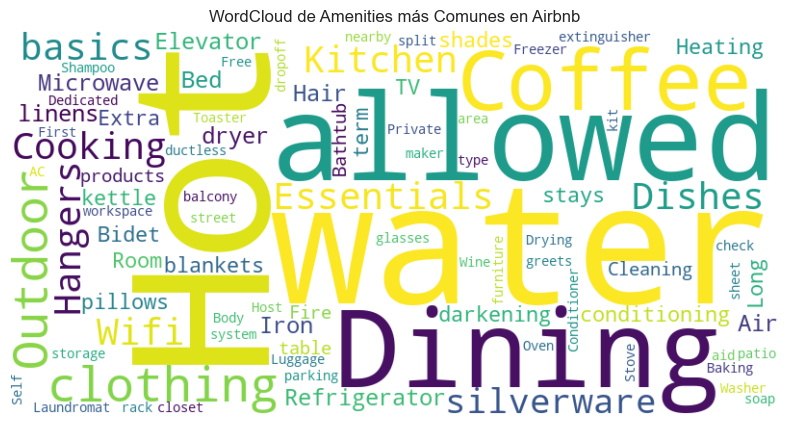

In [92]:
!pip install wordcloud

from wordcloud import WordCloud

# Crea el texto para el WordCloud
wordcloud_text = ' '.join([word for word, _ in word_counts.most_common(50)])  # Las 50 palabras más comunes

# Crea el objeto WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)

# Configura la figura y muestra el WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud de Amenities más Comunes en Airbnb')
plt.show()


# ANFITRIONES CON EL ESTATUS DE SUPERHOST

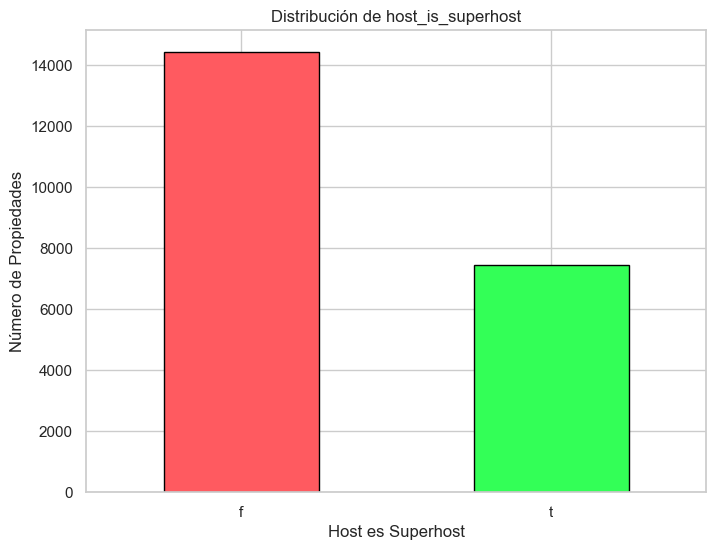

In [93]:
# Eliminar filas en las que 'host_is_superhost' es igual a 'NaN'
data_cleaned = data_cleaned[data_cleaned['host_is_superhost'] != 'NaN']

# Contar la frecuencia de cada categoría en 'host_is_superhost' después de la eliminación
host_superhost_counts = data_cleaned['host_is_superhost'].value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
host_superhost_counts.plot(kind='bar', color=['#ff5a60', '#33ff57'], edgecolor='black')

# Configurar etiquetas y título
plt.title('Distribución de host_is_superhost')
plt.xlabel('Host es Superhost')
plt.ylabel('Número de Propiedades')

# Mostrar el gráfico
plt.xticks(rotation=0)  # Para mostrar las etiquetas en el eje x sin rotación
plt.show()

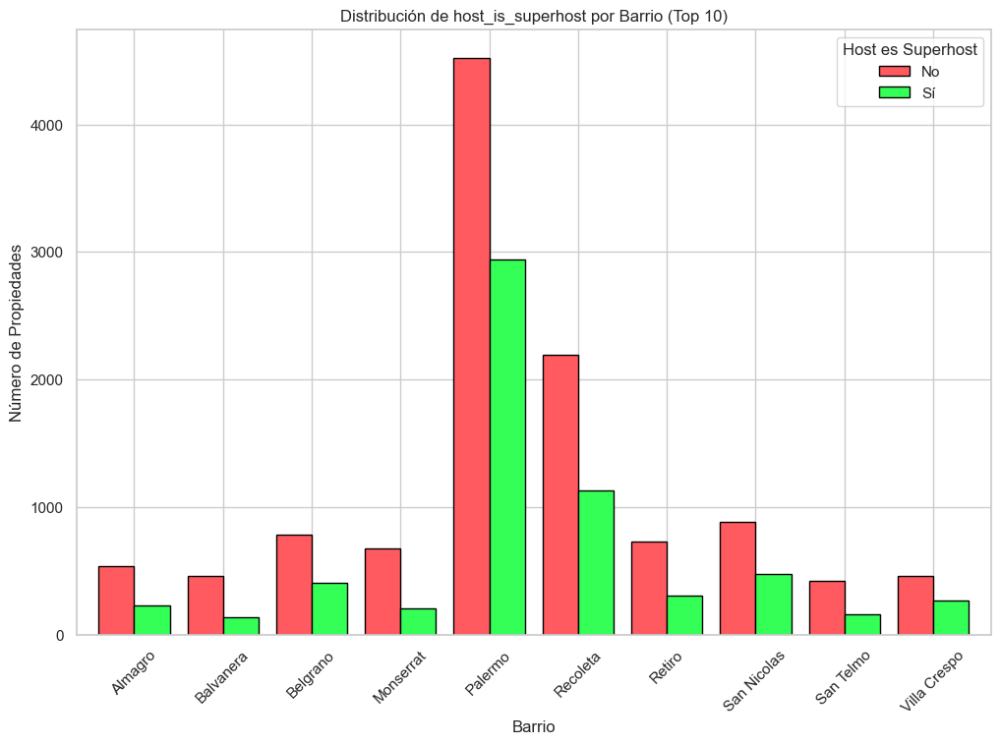

In [94]:
# Supongamos que tienes un DataFrame llamado data_cleaned con columnas 'host_is_superhost' y 'neighbourhood_cleansed'

# Eliminar filas en las que 'host_is_superhost' es igual a 'NaN'
data_cleaned = data_cleaned[data_cleaned['host_is_superhost'] != 'NaN']

# Obtener los 10 primeros barrios en función de su frecuencia
top_10_neighbourhoods = data_cleaned['neighbourhood_cleansed'].value_counts().head(10).index

# Filtrar el DataFrame solo para incluir los 10 primeros barrios
data_top_10_neighbourhoods = data_cleaned[data_cleaned['neighbourhood_cleansed'].isin(top_10_neighbourhoods)]

# Crear una tabla pivote para contar la frecuencia de 'host_is_superhost' por 'neighbourhood_cleansed'
pivot_table = pd.crosstab(index=data_top_10_neighbourhoods['neighbourhood_cleansed'], columns=data_top_10_neighbourhoods['host_is_superhost'])

# Ordenar las columnas de la tabla pivote de mayor a menor
pivot_table = pivot_table[pivot_table.sum().sort_values(ascending=False).index]

# Crear el gráfico de barras agrupadas
pivot_table.plot(kind='bar', figsize=(12, 8), color=['#ff5a60', '#33ff57'], edgecolor='black', width=0.8)

# Configurar etiquetas y título
plt.title('Distribución de host_is_superhost por Barrio (Top 10)')
plt.xlabel('Barrio')
plt.ylabel('Número de Propiedades')
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para una mejor visualización

# Mostrar el gráfico
plt.legend(title='Host es Superhost', labels=['No', 'Sí'])
plt.show()


Los barrios con mayores hospedadores que están calificados como superhost son Palermo y Recoleta a la vez San Nicolás sin embargo, de igual forma, son los barrios que tienen mayor cantidad de hospedadores que no tienen dicha calificación. 